In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from tabulate import tabulate

In [4]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
import scipy.stats as st
from scipy.stats import kurtosis
from scipy.stats import skew

In [6]:
from sklearn.cluster import KMeans

In [7]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import StandardScaler

In [8]:
from sklearn.model_selection import train_test_split

In [9]:
#get the dataset
full_dataset = pd.read_csv("../data/dataset.csv")

In [10]:
full_dataset.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [11]:
full_dataset.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [12]:
full_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [13]:
full_dataset.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


Total bedrooms have null values. What would this practically mean in order to choose the best way to deal with them?

In [14]:
#check high level null values
full_dataset.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

Split the dataset into training and test sets because exploration, cleanups etc needs to be done on the training set and test set is hidden

In [15]:
X, y = full_dataset.drop("median_house_value", axis = 1), full_dataset["median_house_value"]

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [17]:
#create a dataset
X_train["median_house_value"] = y_train
dataset = X_train.copy()

In [18]:
dataset.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
18078,-122.01,37.27,28.0,3825.0,473.0,1415.0,480.0,10.6750,<1H OCEAN,500001.0
19043,-121.76,38.41,19.0,686.0,107.0,348.0,109.0,3.9306,INLAND,93800.0
183,-122.23,37.80,50.0,1746.0,480.0,1149.0,415.0,2.2500,NEAR BAY,123500.0
6163,-117.94,34.08,35.0,2393.0,417.0,1336.0,418.0,4.8700,<1H OCEAN,187700.0
14092,-117.11,32.76,21.0,2226.0,600.0,1085.0,533.0,2.2604,NEAR OCEAN,126300.0


### Correlations

In [19]:
#calculate the correlations
corr_mat=dataset.corr(method='pearson')

In [20]:
corr_mat

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.925648,-0.107737,0.047300,0.072879,0.100339,0.058060,-0.019406,-0.043601
latitude,-0.925648,1.000000,0.011858,-0.036687,-0.069228,-0.107419,-0.072825,-0.074912,-0.145586
housing_median_age,-0.107737,0.011858,1.000000,-0.357314,-0.315364,-0.291194,-0.299042,-0.124358,0.106488
total_rooms,0.047300,-0.036687,-0.357314,1.000000,0.931467,0.855920,0.919468,0.189430,0.126230
total_bedrooms,0.072879,-0.069228,-0.315364,0.931467,1.000000,0.873826,0.979856,-0.012717,0.044625
population,0.100339,-0.107419,-0.291194,0.855920,0.873826,1.000000,0.903366,0.000588,-0.030122
households,0.058060,-0.072825,-0.299042,0.919468,0.979856,0.903366,1.000000,0.007614,0.060516
median_income,-0.019406,-0.074912,-0.124358,0.189430,-0.012717,0.000588,0.007614,1.000000,0.686022
median_house_value,-0.043601,-0.145586,0.106488,0.126230,0.044625,-0.030122,0.060516,0.686022,1.000000


<AxesSubplot:>

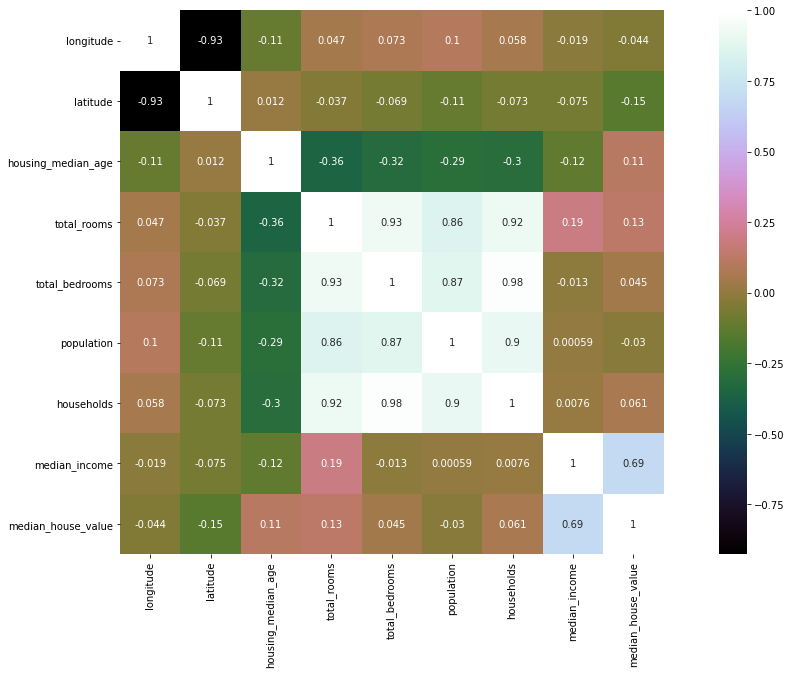

In [21]:
#do a heatmap
plt.figure(figsize=(20,10))
sns.heatmap(corr_mat,vmax=1,square=True,annot=True,cmap='cubehelix')

In [22]:
#see correlations with the median house value
corr_mat["median_house_value"].sort_values(ascending = False)

median_house_value    1.000000
median_income         0.686022
total_rooms           0.126230
housing_median_age    0.106488
households            0.060516
total_bedrooms        0.044625
population           -0.030122
longitude            -0.043601
latitude             -0.145586
Name: median_house_value, dtype: float64

NOTES:

1. Median house value is highly correlated with the median_income (people buy houses they can afford...)
2. Total bedrooms are highly correlated with total rooms
3. Population is highly correlated with total rooms (more rooms, more people...)
4. Number of households is highly correlated with total rooms (more households, more rooms...)
5. Total rooms is moderately correlated with houging median age (probably changes over time meant certain buildings could be built depending no the era?). Same goes for total bedrooms, population, and households

### Individual features exploration

In [23]:
def explore(dataset, column):
    """
    This function helps with the initial high level exploration of a column so we don't keep repeating the steps
    """
    
    #print column's data type
    if dataset[column].dtype.name in ['object', 'category']:
        dtype_group = 'Qualitative'
    elif dataset[column].dtype.name not in ['object', 'category']:
        dtype_group = 'Quantitative'
        
    print(tabulate([['Data type of column ', dataset[column].dtype],
                   ['Data type group ', dtype_group]], headers=['Exploration', 'Results'], tablefmt='orgtbl'))
    print()
    print()
    print()
    
    #missing values
    missing_values = str(dataset[column].isnull().sum()) + " missing values out of " + str(len(dataset['median_house_value']))
    missing_percentages = str(dataset[column].isnull().sum() / len(dataset['median_house_value']) * 100) + "%"
    print(tabulate([['Missing values ', missing_values], ['Missing values ', missing_percentages]], 
                   headers=['Exploration', 'Results'], tablefmt='orgtbl'))
    print()
    print()
    print()
    
    #distribution
    print("Distribution of the data:")
    fig = px.histogram(dataset, x=column)
    fig.show()
    
    #if column is qualitative
    if dtype_group == 'Qualitative':
        
        #print the values counts
        print(tabulate([['Value counts ', dataset[column].value_counts()]], headers=['Exploration', 'Results'], tablefmt='orgtbl'))
        print()
        print()
        print()
        
        #print proportions
        print(tabulate([['Value counts percentages ', dataset[column].value_counts(normalize = True) * 100 ]], headers=['Exploration', 'Results'], tablefmt='orgtbl'))
        print()
        print()
        dataset[column] = dataset[column].astype('category')
        
        #what are some measures of central tendencies for each variable value
        mean_calc = dataset.groupby(column).median_house_value.mean().reset_index()
        print(tabulate([['The average sales variable value is ', mean_calc]], headers=['Exploration', 'Results'], tablefmt='orgtbl'))
        print()
        print()
        print()
        
        std_calc = dataset.groupby(column).median_house_value.std().reset_index()
        print(tabulate([['The standard deviation / spread of the sales is ', std_calc]], headers=['Exploration', 'Results'], tablefmt='orgtbl'))
        print()
        print()
        print()
        
        #let's see how this variable changes on the scatterplot
        plt.figure(figsize = (10, 8))
        sns.scatterplot(x = dataset['longitude'], y = dataset['latitude'], hue = dataset[column])
        plt.show()
        
    elif dtype_group == 'Quantitative':
        
        #creating a boxplot highlighting the mean, median etc
        red_circle = dict(markerfacecolor='red', marker='o')
        mean_shape = dict(markerfacecolor='green', marker='D', markeredgecolor='green')
        plt.figure(figsize = (15, 5))
        plt.boxplot(x=dataset[column][~dataset[column].isnull()], vert=False, flierprops=red_circle, showmeans=True, meanprops=mean_shape, notch=True)
        plt.show()
        print()
        print()
        
        #see the distribution of the loan terms
        #print the values counts
        print(tabulate([['The description of the column:', dataset[column].describe()]], headers=['Exploration', 'Results']))
        print()
        print()
        print()
        
        #calculate the kurtosis
        kurtosis_calculation = kurtosis(dataset[column][~dataset[column].isnull()], fisher=False)
        if kurtosis_calculation > 3:
            conclusion = "The distribution is leptokurtic. The distribution has a sharp peak."
        elif kurtosis_calculation == 3:
            conclusion = "The distribution is mesokurtic. The distribution has a flat peak."
        elif kurtosis_calculation < 3:
            conclusion = "The distribution is platykurtic. The distribution follows a normal distribution."
        
        print(tabulate([['The kurtosis is  ', kurtosis_calculation], ['Conclusion: ', conclusion]], headers=['Exploration', 'Results']))
        print()
        print()
        print()
        
        #calculate the skeweness
        skewness_calculation = skew(dataset[column][~dataset[column].isnull()])
        if skewness_calculation >= -0.5 and skewness_calculation <= 0.5:
            conclusion = "The distribution has low skewness."
        elif (skewness_calculation >= -1 and skewness_calculation <= -0.5) or (skewness_calculation >= 0.5 and skewness_calculation <= 1):
            conclusion = "The distribution has moderate skewness."
        else:
            conclusion = "The distribution has high skewness"
            
        print(tabulate([['The skewness is  ', skewness_calculation], ['Conclusion: ', conclusion]], headers=['Exploration', 'Results']))
        print()
        print()
        print()
        
        
        #test column for normality
        test_normality = lambda x: st.shapiro(x.fillna(0))[1] < 0.01
        normal = pd.DataFrame(dataset[column][~dataset[column].isnull()])
        normal = normal.apply(test_normality)
        print(tabulate([['The column normality  ', not normal.all()]], headers=['Exploration', 'Results']))
        print()
        print()
        print()
        
        #show the correlation for this column and others
        corr_mat=dataset.corr(method='pearson')
        print(tabulate([['The Correlations of column with others  ', corr_mat.loc[column]]], headers=['Exploration', 'Results']))
        print()
        print()
        print()
        
        # Distribution in relation to the target variable:
        plt.figure(figsize = (10, 8))
        plt.title("Distribution of " + column + " in relation to median house value")
        sns.scatterplot(x = dataset[column], y = dataset['median_house_value'])
        plt.show()
        
        #let's see how this variable changes on the scatterplot
        plt.figure(figsize = (10, 8))
        plt.title("Distribution of " + column + " as size on scatter plot")
        sns.scatterplot(x = dataset['longitude'], y = dataset['latitude'], 
                        size= dataset[column], sizes=(20, 200), hue = dataset[column])
        plt.show()


###### [New feature] Latitude & Longitude

We can use the latitude and longitude as x and y values of a scatterplot

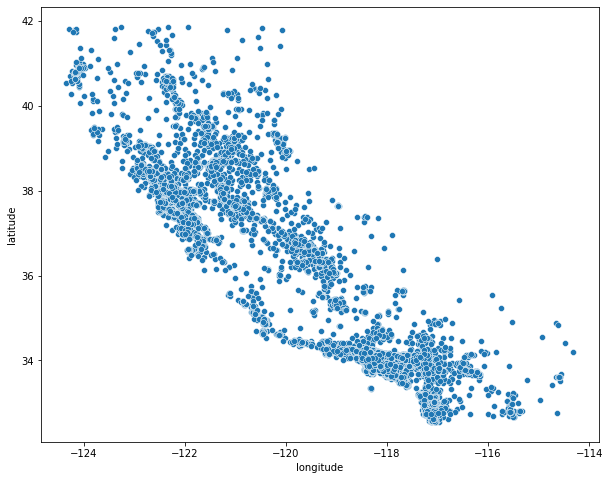

In [24]:
plt.figure(figsize = (10, 8))
sns.scatterplot(x = dataset['longitude'], y = dataset['latitude'])
plt.show()

###### Longitude

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


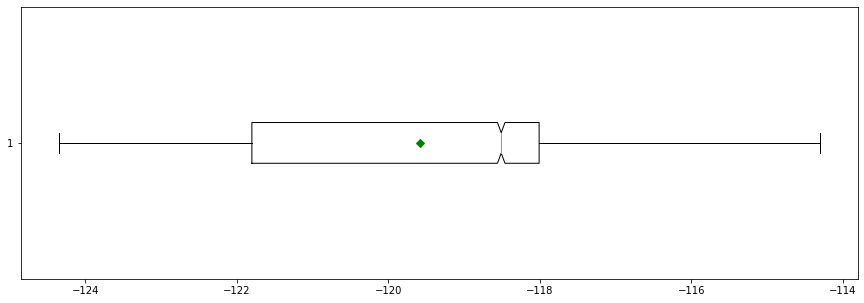



Exploration                     Results
------------------------------  -------------------------------
The description of the column:  count    14448.000000
                                mean      -119.575999
                                std          2.000280
                                min       -124.350000
                                25%       -121.800000
                                50%       -118.510000
                                75%       -118.010000
                                max       -114.310000
                                Name: longitude, dtype: float64



Exploration      Results
---------------  --------------------------------------------------------------------------------
The kurtosis is  1.6573549272056403
Conclusion:      The distribution is platykurtic. The distribution follows a normal distribution.



Exploration      Results
---------------  ----------------------------------
The skewness is  -0.3015471379809627
Conclusion:      The 

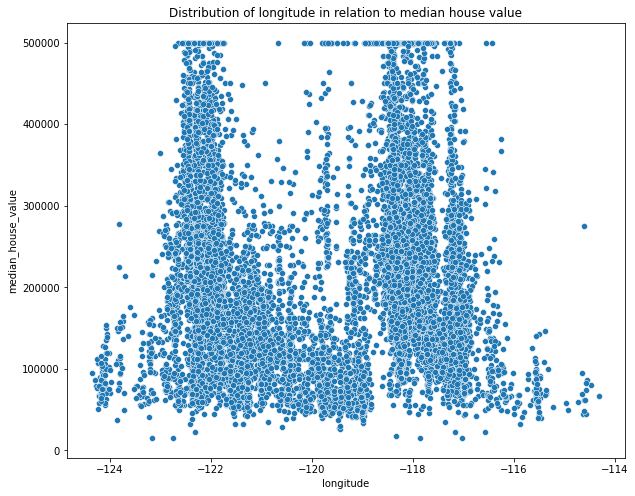

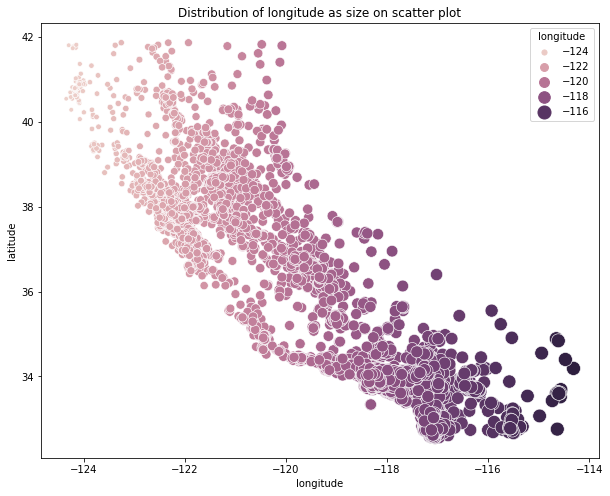

In [25]:
explore(dataset, 'longitude')

NOTES:

1. The points are around the same area as the std is very low.

###### Latitude

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


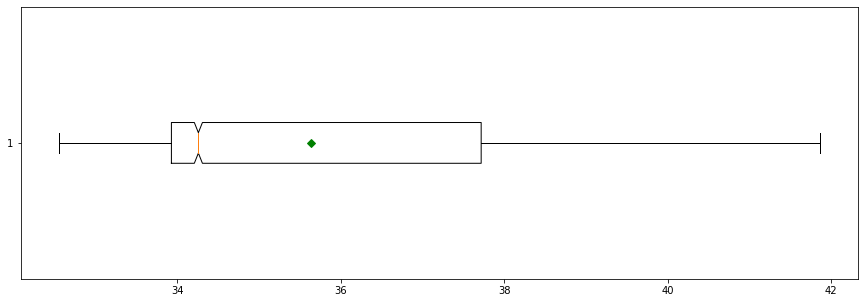



Exploration                     Results
------------------------------  ------------------------------
The description of the column:  count    14448.000000
                                mean        35.641123
                                std          2.137655
                                min         32.550000
                                25%         33.930000
                                50%         34.260000
                                75%         37.720000
                                max         41.860000
                                Name: latitude, dtype: float64



Exploration      Results
---------------  --------------------------------------------------------------------------------
The kurtosis is  1.8665832251742553
Conclusion:      The distribution is platykurtic. The distribution follows a normal distribution.



Exploration      Results
---------------  ----------------------------------
The skewness is  0.45891958859102816
Conclusion:      The di

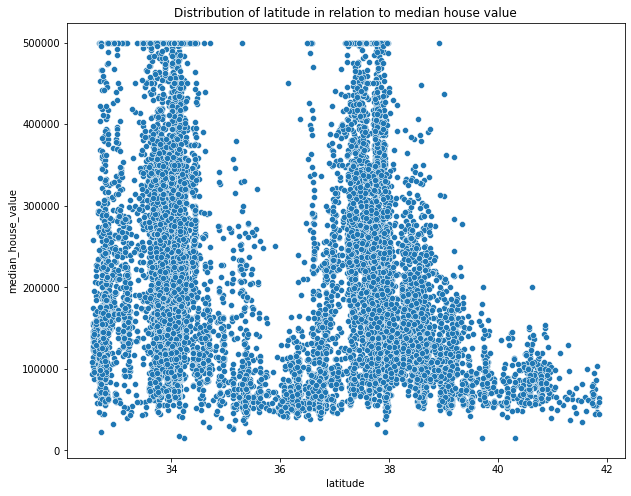

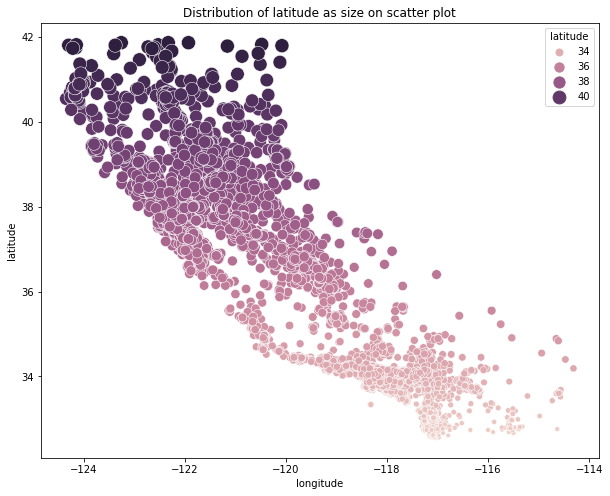

In [26]:
explore(dataset, 'latitude')

NOTES:

1. From the correlation calculations, there is some slightly negative linear relationship with median house value but the graph is not showing it clearly

###### Housing Median Age

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


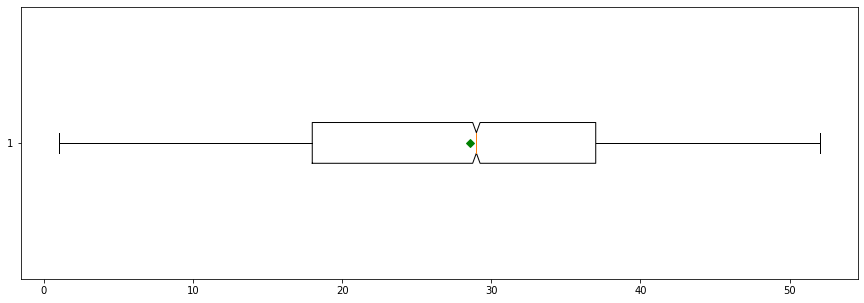



Exploration                     Results
------------------------------  ----------------------------------------
The description of the column:  count    14448.000000
                                mean        28.605551
                                std         12.654196
                                min          1.000000
                                25%         18.000000
                                50%         29.000000
                                75%         37.000000
                                max         52.000000
                                Name: housing_median_age, dtype: float64



Exploration      Results
---------------  --------------------------------------------------------------------------------
The kurtosis is  2.1956731932525844
Conclusion:      The distribution is platykurtic. The distribution follows a normal distribution.



Exploration      Results
---------------  ----------------------------------
The skewness is  0.05687069070600393
Con

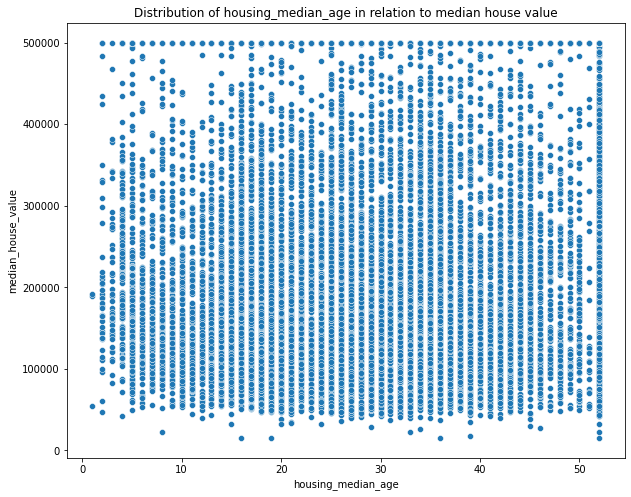

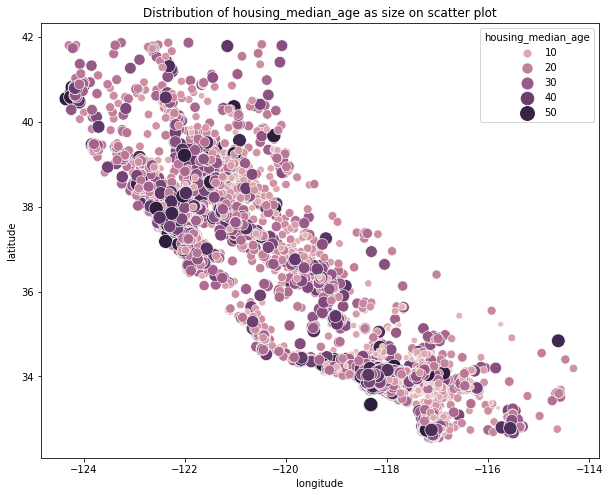

In [27]:
explore(dataset, 'housing_median_age')

###### Total Rooms

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


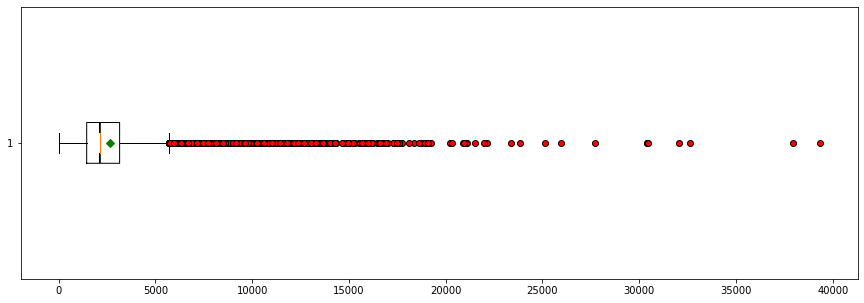



Exploration                     Results
------------------------------  ---------------------------------
The description of the column:  count    14448.000000
                                mean      2642.582226
                                std       2192.193293
                                min          2.000000
                                25%       1452.000000
                                50%       2134.500000
                                75%       3154.250000
                                max      39320.000000
                                Name: total_rooms, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  38.13697249524622
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  4.248782162898053
Conclusion:      The distribution has high ske

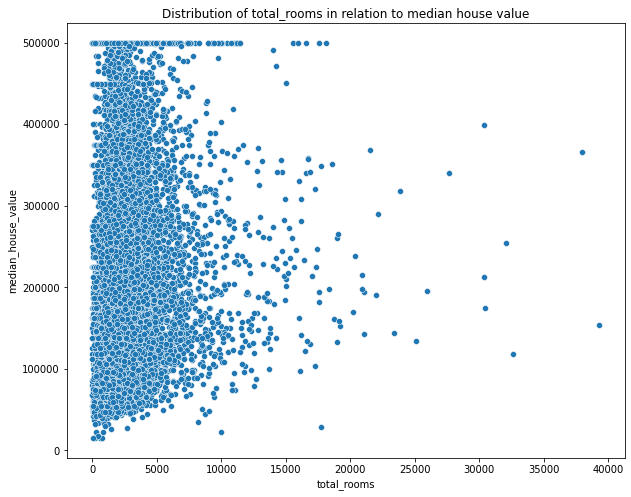

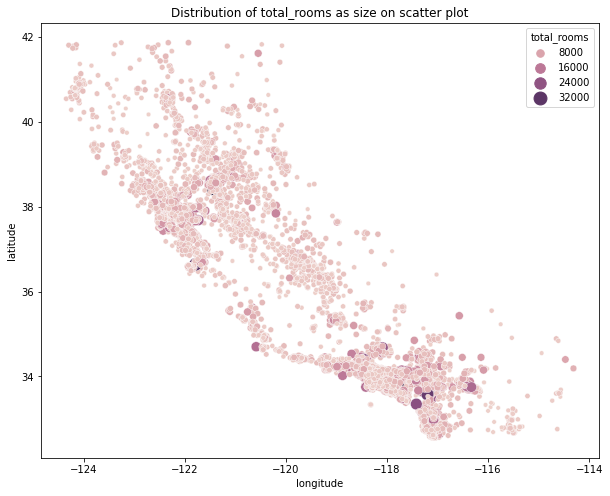

In [28]:
explore(dataset, 'total_rooms')

NOTES:

1. This variable has values in their thousands. What does it mean for a row to have 8000 total rooms?
2. There are some outliers but a majority are around 8000

###### Total bedrooms

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                         |
|----------------+---------------------------------|
| Missing values | 157 missing values out of 14448 |
| Missing values | 1.0866555924695458%             |



Distribution of the data:


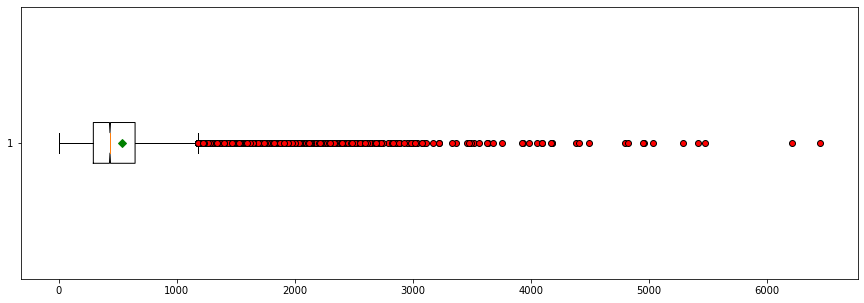



Exploration                     Results
------------------------------  ------------------------------------
The description of the column:  count    14291.000000
                                mean       539.672871
                                std        424.858854
                                min          1.000000
                                25%        295.000000
                                50%        436.000000
                                75%        648.500000
                                max       6445.000000
                                Name: total_bedrooms, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  26.141977555907985
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  3.5181750200324684
Conclusion:      The distribution has 

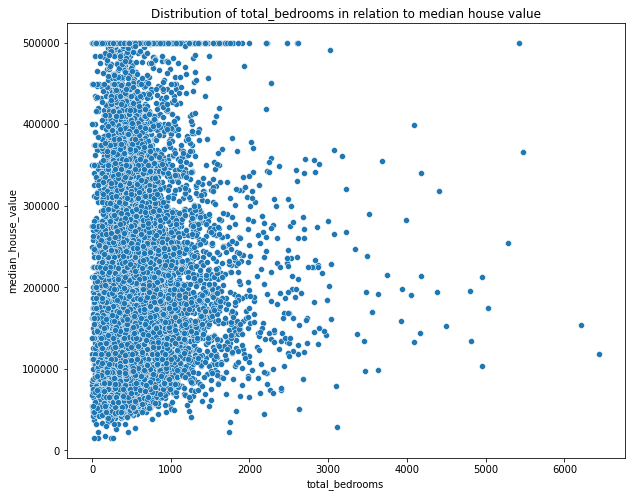

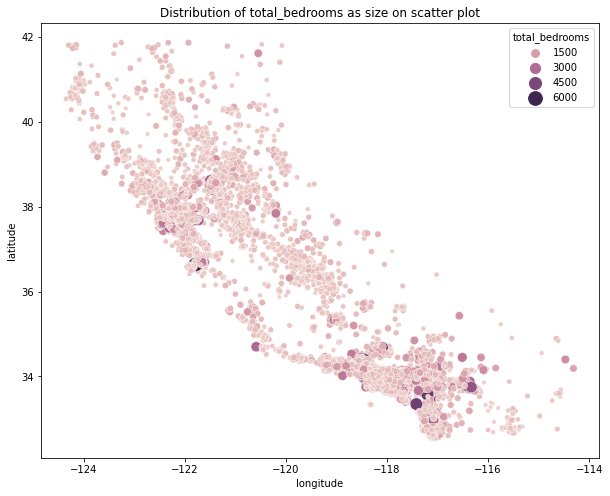

In [29]:
explore(dataset, 'total_bedrooms')

NOTES:

1. Can we create a variable that compares bedrooms to the total rooms
2. For missing values, we can impute them with the mean of ones in that type of location using ocean proximity or location cluster?

###### Population

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


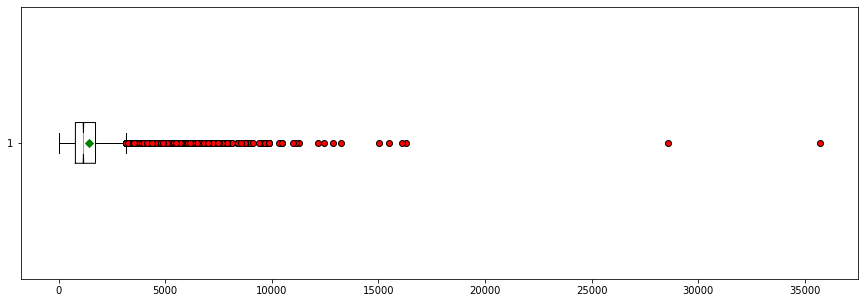



Exploration                     Results
------------------------------  --------------------------------
The description of the column:  count    14448.000000
                                mean      1430.133583
                                std       1155.002747
                                min          3.000000
                                25%        790.000000
                                50%       1167.000000
                                75%       1733.000000
                                max      35682.000000
                                Name: population, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  94.54193904764101
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  5.5578990334905765
Conclusion:      The distribution has high skew

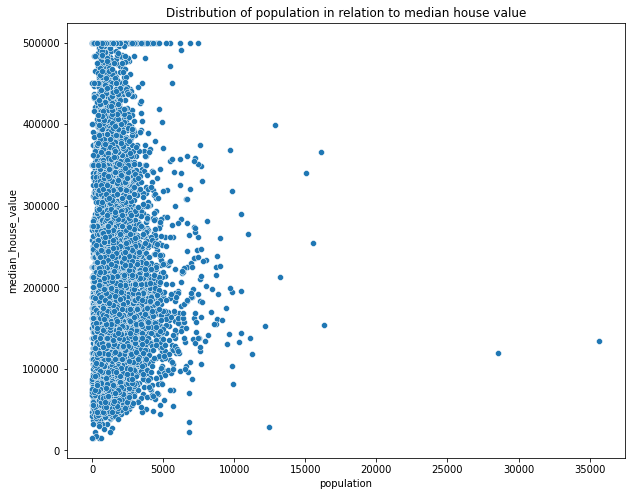

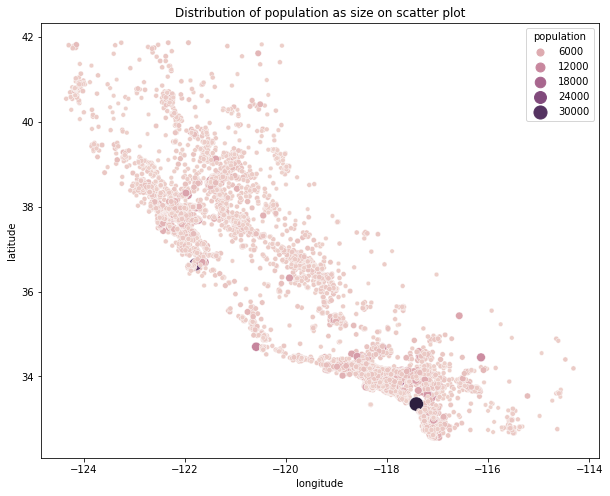

In [30]:
explore(dataset, 'population')

NOTES:

1. Is it possible to bin this into categories such as "low populated", "highly populated" etc

###### Households

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


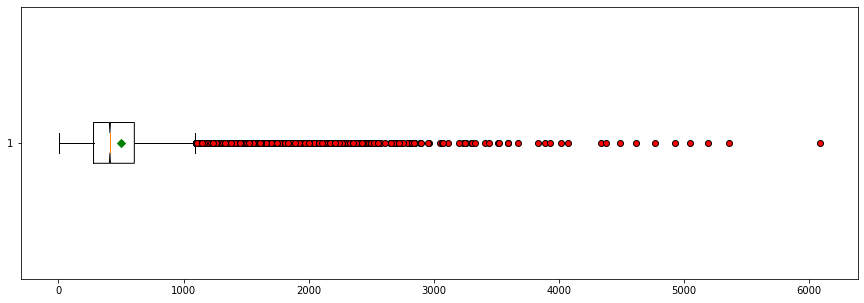



Exploration                     Results
------------------------------  --------------------------------
The description of the column:  count    14448.000000
                                mean       501.272702
                                std        385.032840
                                min          1.000000
                                25%        280.000000
                                50%        411.000000
                                75%        606.000000
                                max       6082.000000
                                Name: households, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  26.157933468237093
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  3.462176725438506
Conclusion:      The distribution has high skew

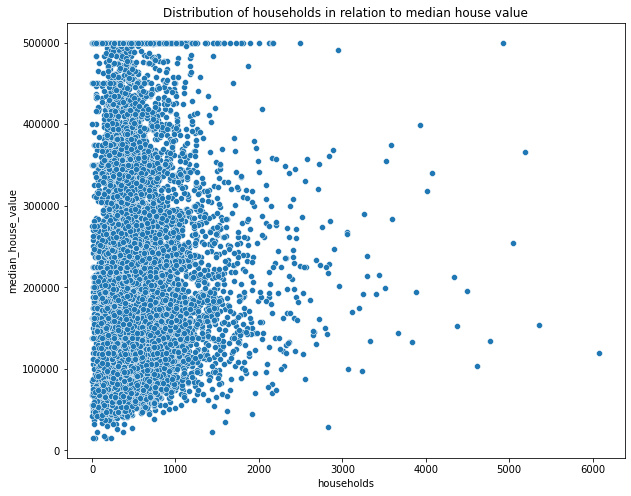

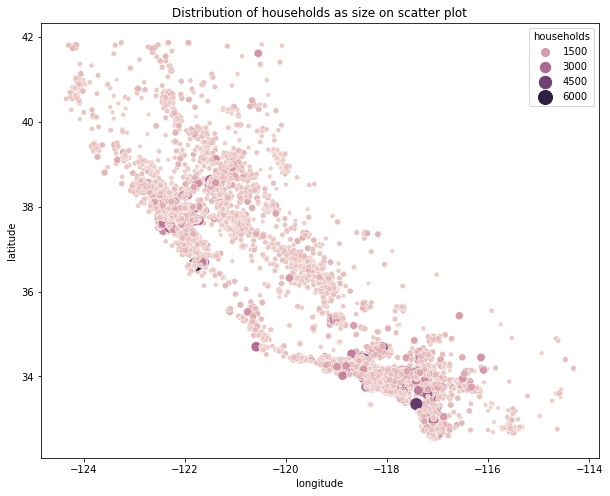

In [31]:
explore(dataset, 'households')

NOTES:

1. Some areas have many households others just one. Does this show that some latitute/longitude have blocks and others free standing houses?

###### Median Income

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


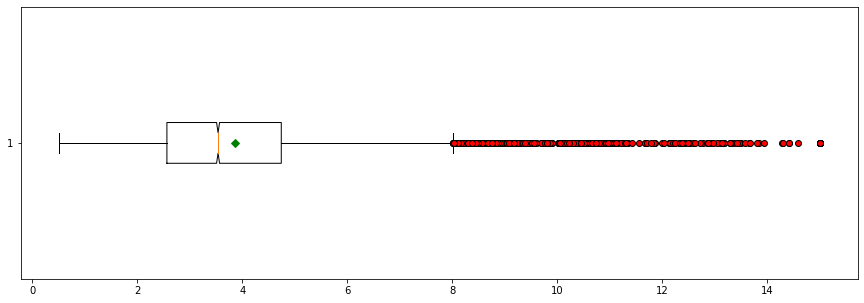



Exploration                     Results
------------------------------  -----------------------------------
The description of the column:  count    14448.000000
                                mean         3.869800
                                std          1.895626
                                min          0.499900
                                25%          2.563550
                                50%          3.538500
                                75%          4.742875
                                max         15.000100
                                Name: median_income, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  8.172332816496038
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  1.6690641567120208
Conclusion:      The distribution has hig

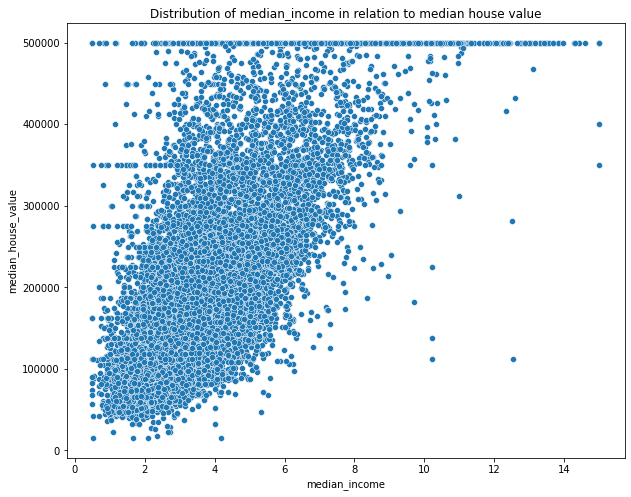

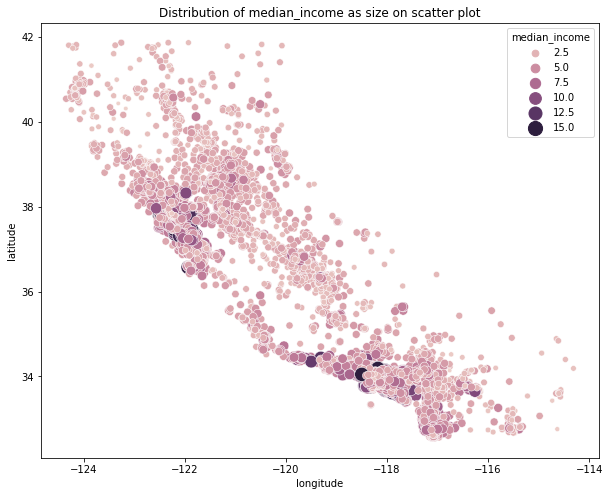

In [32]:
explore(dataset, 'median_income')

NOTES:

1. The median incomes seem to be capped based on the unexpected bar at the beginning and far right
2. They don't have units. Could be in their thousands but cannnot say for sure
3. There are some areas that have large median incomes but a majority is around 2.5 to 5
4. Based on a high correlations ~0.68, the graph confirms the positive relationship between median income and medium house value

###### Ocean proximity

| Exploration         | Results     |
|---------------------+-------------|
| Data type of column | object      |
| Data type group     | Qualitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


| Exploration   | Results                             |
|---------------+-------------------------------------|
| Value counts  | <1H OCEAN     6320                  |
|               | INLAND        4650                  |
|               | NEAR OCEAN    1894                  |
|               | NEAR BAY      1581                  |
|               | ISLAND           3                  |
|               | Name: ocean_proximity, dtype: int64 |



| Exploration              | Results                               |
|--------------------------+---------------------------------------|
| Value counts percentages | <1H OCEAN     43.743079               |
|                          | INLAND        32.184385               |
|                          | NEAR OCEAN    13.109081               |
|                          | NEAR BAY      10.942691               |
|                          | ISLAND         0.020764               |
|                          | Name: ocean_proximity, dtype: float64

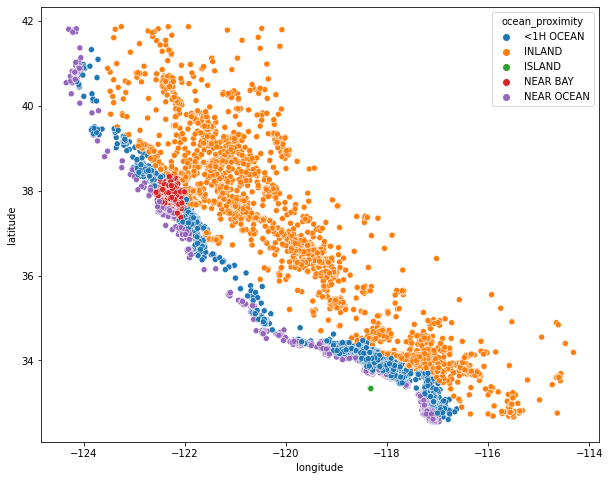

In [33]:
explore(dataset, 'ocean_proximity')

###### [Target]: Median House Value

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


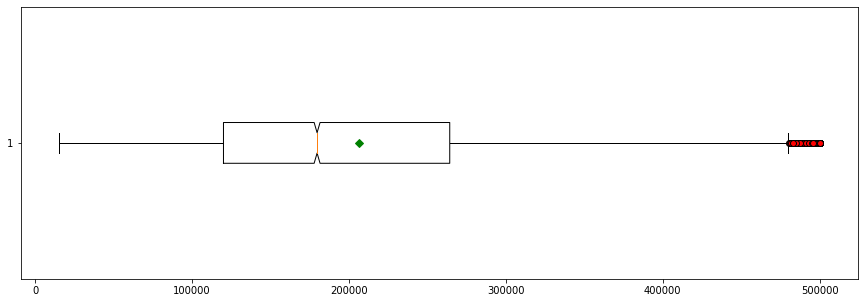



Exploration                     Results
------------------------------  ----------------------------------------
The description of the column:  count     14448.000000
                                mean     206602.468439
                                std      115007.324503
                                min       14999.000000
                                25%      120075.000000
                                50%      179750.000000
                                75%      264300.000000
                                max      500001.000000
                                Name: median_house_value, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  3.3431150871770363
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ---------------------------------------
The skewness is  0.9813981488148823
Conclusion:      

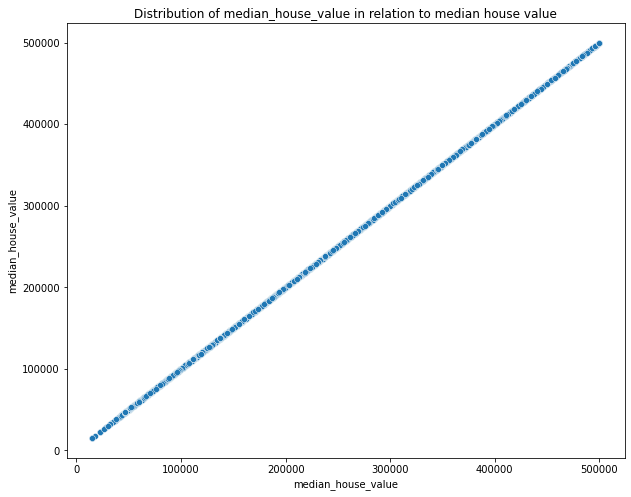

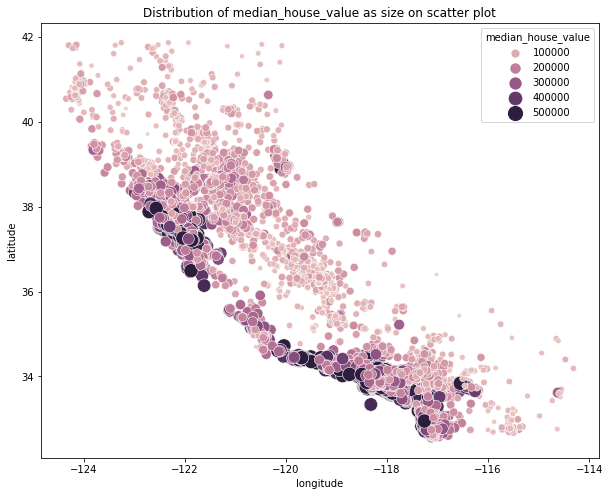

In [34]:
explore(dataset, 'median_house_value')

NOTES:

1. We can see that those close to the ocean are generally more expensive than those more inland
2. This variable has clearly been capped as is seen by the bar at 500 000

### Feature Engineering

###### [New feature]: Rooms per household

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


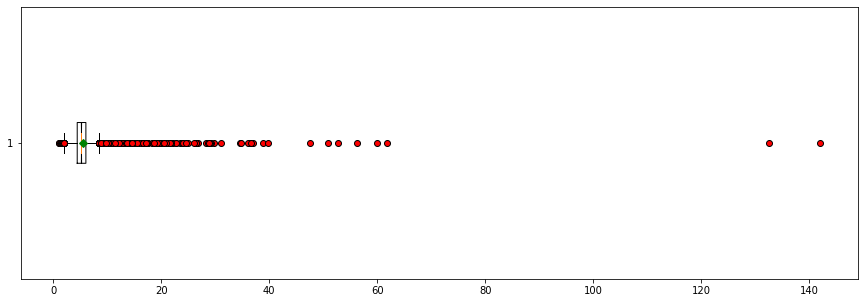



Exploration                     Results
------------------------------  -----------------------------------------
The description of the column:  count    14448.000000
                                mean         5.431785
                                std          2.612301
                                min          1.000000
                                25%          4.443644
                                50%          5.233951
                                75%          6.048293
                                max        141.909091
                                Name: rooms_per_household, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  980.4540028789935
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  22.92148798079751
Conclusion:      The distribut

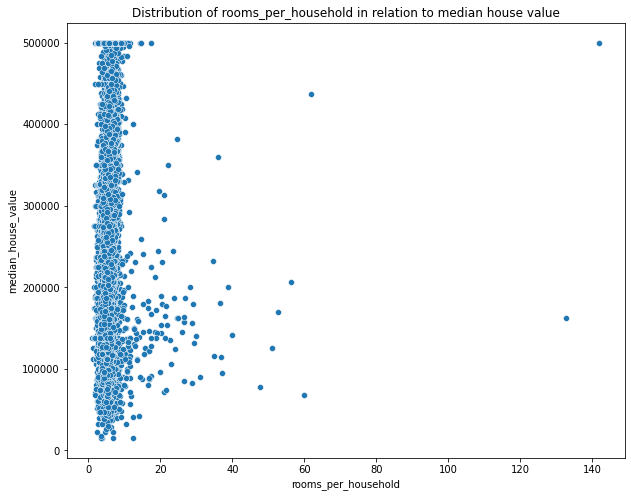

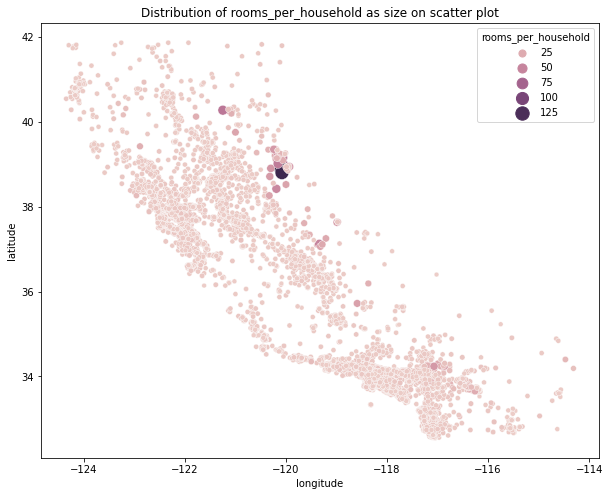

In [35]:
#rooms per household
dataset["rooms_per_household"] = dataset["total_rooms"] / dataset["households"]
explore(dataset, "rooms_per_household")

NOTES:

1. The houses with the highest rooms_per_household are far from the ocean. Does this hint at blocks / flats?

###### [New feature]: Bedrooms per room

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                         |
|----------------+---------------------------------|
| Missing values | 157 missing values out of 14448 |
| Missing values | 1.0866555924695458%             |



Distribution of the data:


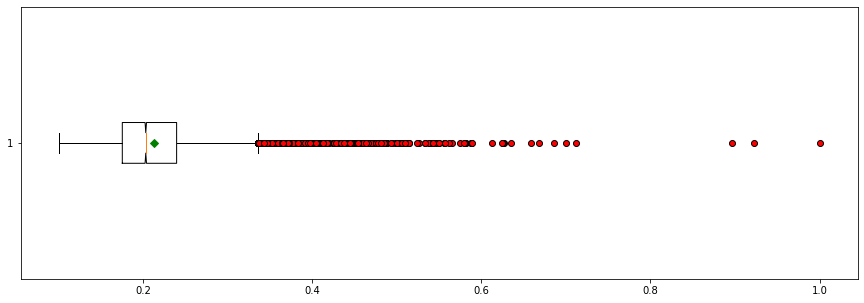



Exploration                     Results
------------------------------  ---------------------------------------
The description of the column:  count    14291.000000
                                mean         0.212953
                                std          0.057567
                                min          0.100000
                                25%          0.175319
                                50%          0.203093
                                75%          0.239571
                                max          1.000000
                                Name: bedrooms_per_room, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  14.597360660517127
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  2.0875293975508864
Conclusion:      The distributio

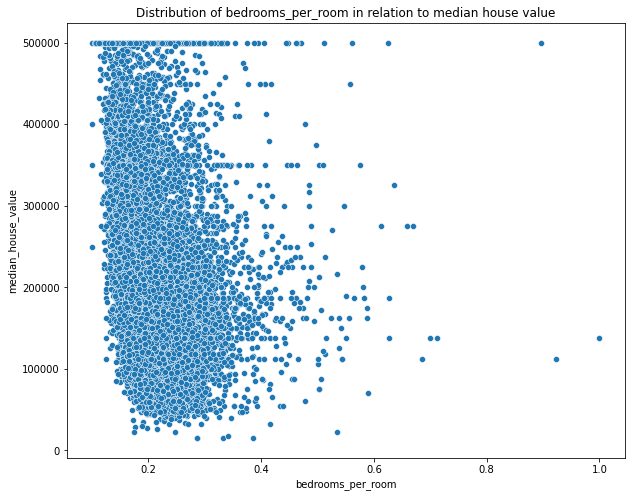

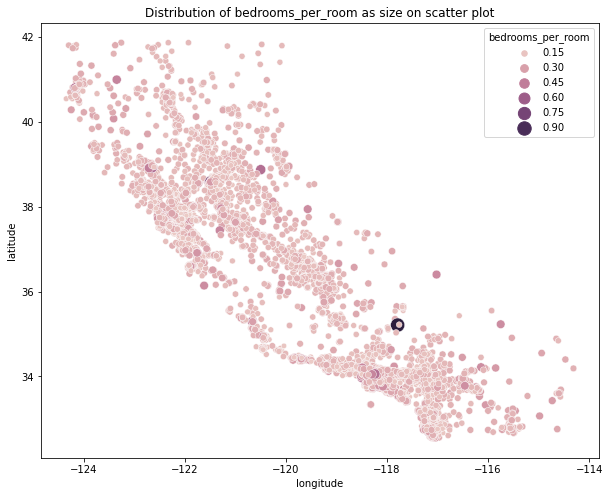

In [36]:
dataset['bedrooms_per_room'] = dataset['total_bedrooms'] / dataset['total_rooms']
explore(dataset, 'bedrooms_per_room')

###### Population per household

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | float64      |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


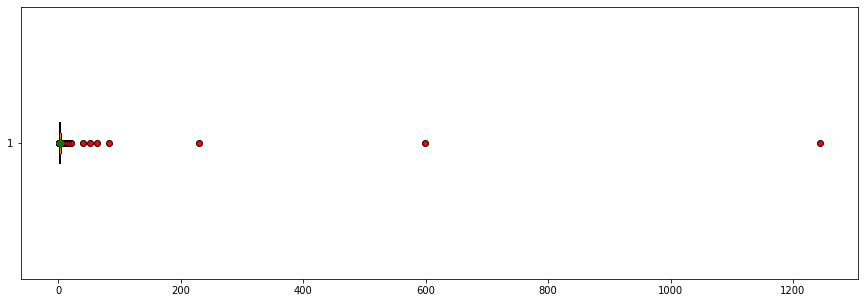



Exploration                     Results
------------------------------  ----------------------------------------------
The description of the column:  count    14448.000000
                                mean         3.092055
                                std         11.681824
                                min          0.692308
                                25%          2.427145
                                50%          2.817623
                                75%          3.281692
                                max       1243.333333
                                Name: population_per_household, dtype: float64



Exploration      Results
---------------  -------------------------------------------------------------------
The kurtosis is  9276.075647754371
Conclusion:      The distribution is leptokurtic. The distribution has a sharp peak.



Exploration      Results
---------------  ----------------------------------
The skewness is  92.6080128070182
Conclusion:      The 

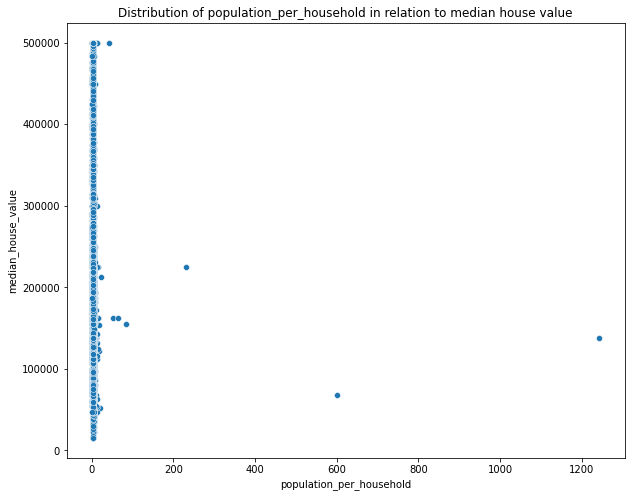

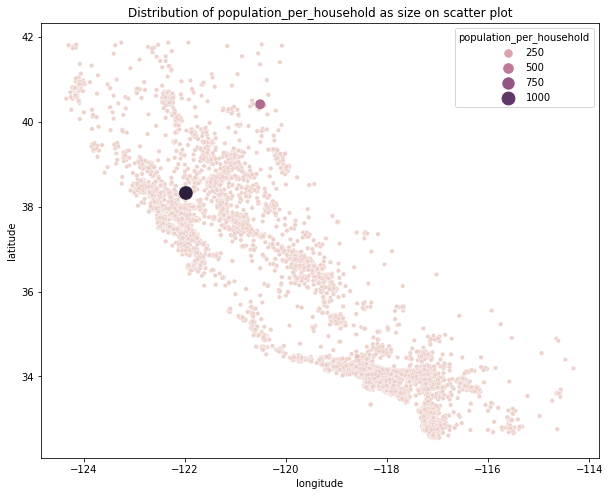

In [37]:
dataset['population_per_household'] = dataset['population'] / dataset['households']
explore(dataset, 'population_per_household')

### Cluster analysis 

There might be some interesting clusters in the dataset.
These clusters can be used to create new features or to inform ways to impute missing values so when creating the clusters, remove columns that have missing values i.e. total_bedrooms in this case.

Use features that are showing high correlations with the target variable, median_house_value

In [38]:
X = dataset[['longitude', 'latitude', 'median_income', 'rooms_per_household', 'population_per_household']]

In [39]:
#set up the elbow method to find the right k
wcss = [] 
for i in range(1, 11): 
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)

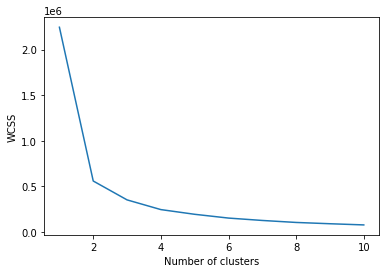

In [40]:
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()

In [41]:
#now train with k = 3
kmeans = KMeans(n_clusters = 4, init = "k-means++", random_state = 42)
y_kmeans = kmeans.fit_predict(X)

In [42]:
#add these clusters to the dataset
dataset["Cluster"] = y_kmeans

| Exploration         | Results      |
|---------------------+--------------|
| Data type of column | int32        |
| Data type group     | Quantitative |



| Exploration    | Results                       |
|----------------+-------------------------------|
| Missing values | 0 missing values out of 14448 |
| Missing values | 0.0%                          |



Distribution of the data:


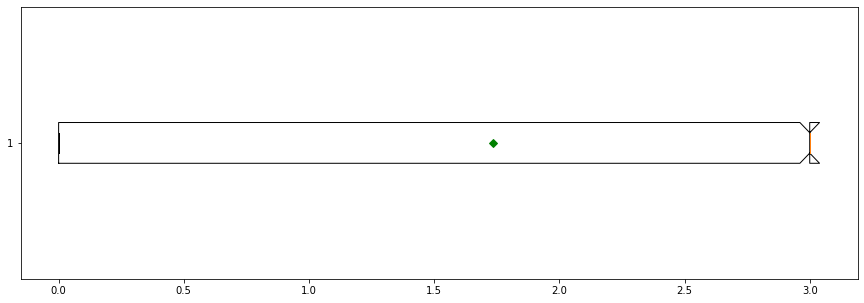



Exploration                     Results
------------------------------  -----------------------------
The description of the column:  count    14448.000000
                                mean         1.736711
                                std          1.481163
                                min          0.000000
                                25%          0.000000
                                50%          3.000000
                                75%          3.000000
                                max          3.000000
                                Name: Cluster, dtype: float64



Exploration      Results
---------------  --------------------------------------------------------------------------------
The kurtosis is  1.1022716523479568
Conclusion:      The distribution is platykurtic. The distribution follows a normal distribution.



Exploration      Results
---------------  ----------------------------------
The skewness is  -0.31961947193615015
Conclusion:      The dis

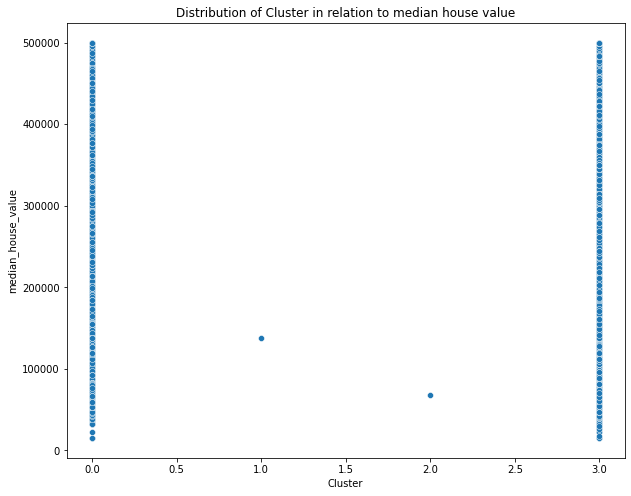

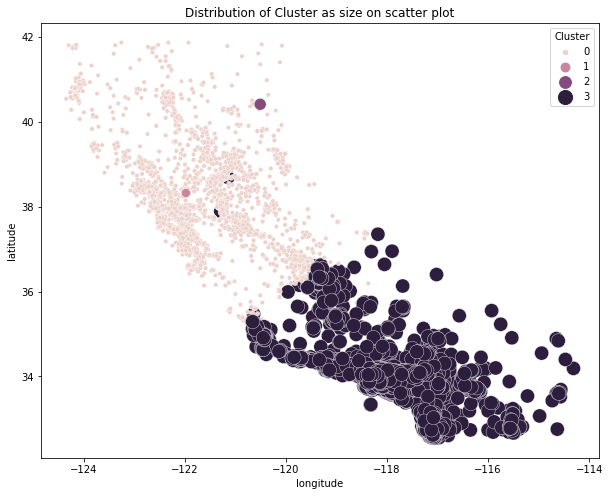

In [43]:
#explore this new feature
explore(dataset, 'Cluster')

In [44]:
dataset.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,rooms_per_household,bedrooms_per_room,population_per_household,Cluster
18078,-122.01,37.27,28.0,3825.0,473.0,1415.0,480.0,10.6750,<1H OCEAN,500001.0,7.968750,0.123660,2.947917,0
19043,-121.76,38.41,19.0,686.0,107.0,348.0,109.0,3.9306,INLAND,93800.0,6.293578,0.155977,3.192661,0
183,-122.23,37.80,50.0,1746.0,480.0,1149.0,415.0,2.2500,NEAR BAY,123500.0,4.207229,0.274914,2.768675,0
6163,-117.94,34.08,35.0,2393.0,417.0,1336.0,418.0,4.8700,<1H OCEAN,187700.0,5.724880,0.174258,3.196172,3
14092,-117.11,32.76,21.0,2226.0,600.0,1085.0,533.0,2.2604,NEAR OCEAN,126300.0,4.176360,0.269542,2.035647,3


In [45]:
dataset.isnull().sum()

longitude                     0
latitude                      0
housing_median_age            0
total_rooms                   0
total_bedrooms              157
population                    0
households                    0
median_income                 0
ocean_proximity               0
median_house_value            0
rooms_per_household           0
bedrooms_per_room           157
population_per_household      0
Cluster                       0
dtype: int64

### Data Cleaning

In [46]:
columns = dataset.columns

median_house_value = dataset["median_house_value"]

numerical_columns = dataset._get_numeric_data().columns

In [47]:
categorical_columns = list(set(columns) - set(numerical_columns))
categorical_columns

['ocean_proximity']

###### Missing values



In [53]:
dataset.isnull().sum()

longitude                   0
latitude                    0
housing_median_age          0
total_rooms                 0
total_bedrooms              0
population                  0
households                  0
median_income               0
ocean_proximity             0
median_house_value          0
rooms_per_household         0
bedrooms_per_room           0
population_per_household    0
Cluster                     0
dtype: int64

In [52]:
#imput any potentially missing data based on Cluster number (include all just in case future data has different missing values)
dataset["longitude"] = dataset.groupby("Cluster")["longitude"].apply(lambda x: x.fillna(x.mean()))
dataset["total_rooms"] = dataset.groupby("Cluster")["total_rooms"].apply(lambda x: x.fillna(x.mean()))
dataset["total_bedrooms"] = dataset.groupby("Cluster")["total_bedrooms"].apply(lambda x: x.fillna(x.mean()))
dataset["population"] = dataset.groupby("Cluster")["population"].apply(lambda x: x.fillna(x.mean()))
dataset["households"] = dataset.groupby("Cluster")["households"].apply(lambda x: x.fillna(x.mean()))
dataset["median_income"] = dataset.groupby("Cluster")["median_income"].apply(lambda x: x.fillna(x.mean()))
dataset["median_house_value"] = dataset.groupby("Cluster")["median_house_value"].apply(lambda x: x.fillna(x.mean()))
dataset["rooms_per_household"] = dataset.groupby("Cluster")["rooms_per_household"].apply(lambda x: x.fillna(x.mean()))
dataset["bedrooms_per_room"] = dataset.groupby("Cluster")["bedrooms_per_room"].apply(lambda x: x.fillna(x.mean()))
dataset["population_per_household"] = dataset.groupby("Cluster")["population_per_household"].apply(lambda x: x.fillna(x.mean()))

#categorical variables will be the modes 
ocean_proximity_mode = dataset.groupby("Cluster")["ocean_proximity"].apply(lambda x: x.fillna(x.mode()[0]))

In [ ]:
data

###### Handling categorical attributes

In [54]:
#do both label encoding and onehot encoding at once
dataset = pd.get_dummies(dataset)

In [55]:
columns = dataset.columns

In [56]:
columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'rooms_per_household', 'bedrooms_per_room',
       'population_per_household', 'Cluster', 'ocean_proximity_<1H OCEAN',
       'ocean_proximity_INLAND', 'ocean_proximity_ISLAND',
       'ocean_proximity_NEAR BAY', 'ocean_proximity_NEAR OCEAN'],
      dtype='object')

###### Feature Scaling

In [57]:
scaler = StandardScaler()

dataset = scaler.fit_transform(dataset)

### Save the dataset

In [58]:
dataset = pd.DataFrame(dataset, columns = columns)

In [59]:
dataset.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,bedrooms_per_room,population_per_household,Cluster,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-1.216872,0.762019,-0.047855,0.539395,-0.157840,-0.013103,-0.055251,3.590072,2.551217,0.971195,-1.559601,-0.012339,-1.172573,1.134053,-0.688902,-0.014411,-0.350532,-0.388418
1,-1.091885,1.295332,-0.759107,-0.892554,-1.024033,-0.936942,-1.018838,0.032075,-0.980863,0.329909,-0.995187,0.008612,-1.172573,-0.881793,1.451584,-0.014411,-0.350532,-0.388418
2,-1.326861,1.009963,1.690758,-0.409003,-0.141273,-0.243414,-0.224074,-0.854523,-0.722609,-0.468782,1.082074,-0.027683,-1.172573,-0.881793,-0.688902,-0.014411,2.852809,-0.388418
3,0.817914,-0.730322,0.505340,-0.113854,-0.290372,-0.081504,-0.216282,0.527654,-0.164365,0.112202,-0.675896,0.008913,0.852933,1.134053,-0.688902,-0.014411,-0.350532,-0.388418
4,1.232870,-1.347842,-0.601051,-0.190036,0.142724,-0.298827,0.082404,-0.849036,-0.698262,-0.480599,0.988246,-0.090435,0.852933,-0.881793,-0.688902,-0.014411,-0.350532,2.574548


In [60]:
dataset.to_csv("../data/dataset_clean.csv", index = False)